# Setup

Run this section to set up your Colab notebook!  This will load all the Python libraries and download all the data files that you'll need.  You will only need to run this section once, each time you start the notebook.

In [2]:
#Install the required package for reading in video data
!pip install pyvideoreader

#Import dependencies
import numpy as np
import matplotlib.pyplot as plt
from videoreader import VideoReader
import plotly.express as px
import cv2
from google.colab import files
import pandas as pd
import os

#Download video files
vids = ['1Bldg_0p04mpers_short.mp4', '1Bldg_0p15mpers_short.mp4', '1Bldg_0p1mpers_short.mp4', '4Bldg_0p04mpers_short.mp4', '4Bldg_0p15mpers_short.mp4', '4Bldg_0p1mpers_short.mp4', 'NoObs_0p04mpers_short.mp4', 'NoObs_0p15mpers_short.mp4', 'NoObs_0p15mpers_short_small.mp4', 'NoObs_0p1mpers_short.mp4']

for file in vids:
  if not os.path.exists(file):
    path = 'https://github.com/ag12s/CreateWithCodeModules/raw/main/Modeling%20Pollution%20with%20Python/Data/' + file
    !wget $path

     |████████████████████████████████| 37.1 MB 47 kB/s 
--2021-07-27 18:55:26--  https://github.com/ag12s/CreateWithCodeModules/raw/main/Modeling%20Pollution%20with%20Python/Data/1Bldg_0p04mpers_short.mp4
Resolving github.com (github.com)... 140.82.121.3
Connecting to github.com (github.com)|140.82.121.3|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://raw.githubusercontent.com/ag12s/CreateWithCodeModules/main/Modeling%20Pollution%20with%20Python/Data/1Bldg_0p04mpers_short.mp4 [following]
--2021-07-27 18:55:27--  https://raw.githubusercontent.com/ag12s/CreateWithCodeModules/main/Modeling%20Pollution%20with%20Python/Data/1Bldg_0p04mpers_short.mp4
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1537581 (1.5M) [application

# Working with Video Files

We'll use a Python library called ***OpenCV*** (also known as cv2) to read our video files.  In this example, we've chosen to use the file `'1Bldg_0p04mpers_short.mp4'`.  To repurpose this code for a different file, you'll only need to change the file name once, right here in this cell.

In this cell, we'll use ***OpenCV*** to read a video file, then loop through each frame in the video and save each frame individually as a *JPEG* image file.  This allows us to "freeze time" and analyze each frame of the video independently from the rest.  Ultimately, of course, we'll want bring these frame-by-frame results back together to draw conclusions based on the entire data file.

In [3]:
# Which file would you like to work with?
video_file = '1Bldg_0p04mpers_short.mp4'
cap2 = cv2.VideoCapture(video_file) # open the video file

# How many frames do you want to work with?
start = 1
end = 10

# While the video file is open, we iterate through the video, extract the frames, and save them to a JPEG image file. 
frame_count = start
while (cap2.isOpened()):
    if frame_count >= start and frame_count < (end+1):
        error,image = cap2.read()
        if error == False:
            break
        image_filename = 'Frame_'+str(frame_count)+'.jpg'
        cv2.imwrite(image_filename, image) # save frame as JPEG file      
        print('Saved a new frame:', image_filename)
    frame_count += 1
    if frame_count == (end+1): #close video file once frames have been retrieved
        cap2.release() 

Saved a new frame: Frame_1.jpg
Saved a new frame: Frame_2.jpg
Saved a new frame: Frame_3.jpg
Saved a new frame: Frame_4.jpg
Saved a new frame: Frame_5.jpg
Saved a new frame: Frame_6.jpg
Saved a new frame: Frame_7.jpg
Saved a new frame: Frame_8.jpg
Saved a new frame: Frame_9.jpg
Saved a new frame: Frame_10.jpg


# Working with Image Files

Let's take a look at one of our image files.  First, we'll want to read it in and display it in our notebook, as shown below.

In [4]:
img_rgb = plt.imread('Frame_1.jpg')
fig = px.imshow(img_rgb)
fig.show()

This frame shows some great plume behavior, however, there's also some extraneous information here.  Not only do we not need it, but we don't want this information to skew our analyses down the road.  Let's handle this by cropping our frame to the paper at the top.

Since our image file was read in as a matrix, we can use Python's *list slicing* feature to crop our image.  This refers to accessing a list or matrix at a specific range of indices.  For our example, let's eyeball the image displayed in the previous cell.  We'll decide we want to consider only the rectangular area between pixels 450 and 650 in the vertical direction, and between 290 and 1032 in the horizontal direction.  So, our Python slicing syntax looks like:

```
cropped_image = image[400:650, 290:1032, :]
```

Note that the last column here specifies which colors we'd like.  JPEG images store colors as RGB (red, green, blue) values, meaning there are three numbers that determine the color of each pixel.  Since we'd like to keep all three colors, we use a single semicolon `:` or equivalently, `0:3`.

In [5]:
# Crop the image and display the cropped image.
img_rgb = img_rgb[100:300,290:1032,:]
fig = px.imshow(img_rgb)
fig.show()

Great!  Now we need to tell the computer how to make sense of what we're looking at.  For our purposes, let's tell the computer that each pixel in this image falls into one of three categories: light, medium, or dark.  Splitting up the data like this will allow us to quickly estimate the concentration of the plume, and will make our analysis much easier.

Let's set some color ranges for what we consider to be light, medium, and dark.  Mouse over the image above and take a look at the `z` values that pop up over your cursor.  You'll see that `z` holds an array of three integers -- these are the RGB values that correspond to that pixel.  Put your cursor over a few pixels to get an idea of the range of RGB values that you'd consider to be light, medium, and dark.

In [6]:
#input concentration ranges
dark_red = 190 
dark_green = 75  
dark_blue = 40  

med_red = 198
med_green = 108
med_blue = 44

light_red = 213
light_green = 154
light_blue = 94

# Analysing Multiple Frames

Great, now we're all set up and ready to work with our data.  Let's load up those ten frames that we saved earlier and see if we can spot any trends over time that might occur in this video.  We'll stack them into a single large matrix so we can easily work with all the data at once, then splice this into three matrices -- one for each color.

In [7]:
# Read in ten image files from video frames
img_rgb   = plt.imread('Frame_1.jpg')[100:300,290:1032,:]
img_rgb2  = plt.imread('Frame_2.jpg')[100:300,290:1032,:]
img_rgb3  = plt.imread('Frame_3.jpg')[100:300,290:1032,:]
img_rgb4  = plt.imread('Frame_4.jpg')[100:300,290:1032,:]
img_rgb5  = plt.imread('Frame_5.jpg')[100:300,290:1032,:]
img_rgb6  = plt.imread('Frame_6.jpg')[100:300,290:1032,:]
img_rgb7  = plt.imread('Frame_7.jpg')[100:300,290:1032,:]
img_rgb8  = plt.imread('Frame_8.jpg')[100:300,290:1032,:]
img_rgb9  = plt.imread('Frame_9.jpg')[100:300,290:1032,:]
img_rgb10 = plt.imread('Frame_10.jpg')[100:300,290:1032,:]

# Put all the frames into a matrix
img_rgb = np.stack((img_rgb,img_rgb2,img_rgb3,img_rgb4,img_rgb5,img_rgb6,img_rgb7,img_rgb8,img_rgb9,img_rgb10), axis = -1)

# splicing frames into red, green, blue matrices
Red = img_rgb[:,:,0,:]
Green = img_rgb[:,:,1,:]
Blue = img_rgb[:,:,2,:]

Next, let's separate the pixels of each frame into dark, medium, and light categories based on how **red** they are.  We have three nested loops here -- the outermost loop (`k`) goes through each of our ten frames, while the inner two loops (`i` and `j`) go over the pixels in each image.  Here, `i` specifies the vertical coordinate of a pixel, and `j` specifies the horizontal coordinate.

In [8]:
#initialize color range matrices for Red
Red_light = np.zeros(Red.shape)
Red_med = np.zeros(Red.shape)
Red_dark = np.zeros(Red.shape)

# Separate colors by dark, medium, and light color ranges for RED
for k in range(np.size(Red,2)): # loop over time (frames)
  for i in range(len(Red)): # loop over vertical direction
    for j in range(np.size(Red, 1)): # loop over horizontal direction
      if Red[i,j,k] <= dark_red:
        Red_dark[i,j,k] = Red[i,j,k]
      elif Red[i,j,k] > dark_red and Red[i,j,k] < light_red:
        Red_med[i,j,k] = Red[i,j,k]
      elif Red[i,j,k] >= light_red:
        Red_light[i,j,k] = Red[i,j,k]


Let's repeat the same process, but this time we'll consider how **green** each pixel is.  Finally, we'll repeat it again for how **blue** each pixel is.

In [9]:
#initialize color range matrices for Green
Green_light = np.zeros(Green.shape)
Green_med = np.zeros(Green.shape)
Green_dark = np.zeros(Green.shape)

# Separate colors by dark, medium, and light color ranges for Green, using the ranges for Red
for k in range(np.size(Green,2)): # loop over time (frames)
  for i in range(len(Green)): # loop over vertical direction
    for j in range(np.size(Green, 1)): # loop over horizontal direction
      if Green[i,j,k] <= dark_green:
        Green_dark[i,j,k] = Red_dark[i,j,k]
      elif Green[i,j,k] > dark_green and Green[i,j,k] < light_green:
        Green_med[i,j,k] = Red_med[i,j,k]
      elif Green[i,j,k] >= light_green:
        Green_light[i,j,k] = Red_light[i,j,k]


In [10]:
#Initialize color range matrices
Blue_light = np.zeros(Blue.shape)
Blue_med = np.zeros(Blue.shape)
Blue_dark = np.zeros(Blue.shape)

# Separate colors by dark, medium, and light color ranges for Green, using the ranges for Green
for k in range(np.size(Blue,2)): # loop over time (frames)
  for i in range(len(Blue)): # loop over vertical direction
    for j in range(np.size(Blue, 1)): # loop over horizontal direction
      if Blue[i,j,k] <= dark_blue:
        Blue_dark[i,j,k] = Green_dark[i,j,k]
      elif Blue[i,j,k] > dark_blue and Blue[i,j,k] < light_blue:
        Blue_med[i,j,k] = Green_med[i,j,k]
      elif Blue[i,j,k] >= light_blue:
        Blue_light[i,j,k] = Green_light[i,j,k]


This leaves us with three matrices, containing only those pixels that have satisfies the light, medium, or dark criteria that we specified earlier.  So, a pixel is only in the dark matrix if its red, green, *and* blue values are darker than the specified thresholds.


In [11]:
# Rewrite into single dark, medium, and light matrices
# To do this, we save our final color (Blue dark/med/light) since it has whittled down the areas satisfying all 3 color ranges
dark = Blue_dark
med = Blue_med
light = Blue_light

Let's also store the minimum and maximum values at each pixel, from across all frames.

In [12]:
#Initialize arrays for storage
dark_mm = np.zeros((np.size(img_rgb,1), np.size(img_rgb,3)))
dark_min = np.zeros((np.size(img_rgb,1), np.size(img_rgb,3)))
dark_max = np.zeros((np.size(img_rgb,1), np.size(img_rgb,3)))
med_mm = np.zeros((np.size(img_rgb,1), np.size(img_rgb,3)))
med_min = np.zeros((np.size(img_rgb,1), np.size(img_rgb,3)))
med_max = np.zeros((np.size(img_rgb,1), np.size(img_rgb,3)))
light_mm = np.zeros((np.size(img_rgb,1), np.size(img_rgb,3)))
light_min = np.zeros((np.size(img_rgb,1), np.size(img_rgb,3)))
light_max = np.zeros((np.size(img_rgb,1), np.size(img_rgb,3)))

# Get number of rows and columns in each image
total_row = np.size(img_rgb,0)
total_col = np.size(img_rgb,1)

for i in range(np.size(img_rgb,1)):  
  for j in range(np.size(img_rgb,3)):
    
    # Identify area in image to be analyzed
    dark_nonzero_idx = list(zip(*np.where(dark[:,:,j] > 0)))
    med_nonzero_idx = list(zip(*np.where(med[:,:,j] > 0)))
    light_nonzero_idx = list(zip(*np.where(light[:,:,j] > 0)))

    # Number of pixels with concentration
    dark_mm[i,j] = len(dark_nonzero_idx)
    med_mm[i,j] = len(med_nonzero_idx)
    light_mm[i,j] = len(light_nonzero_idx)

    # Min/max
    if dark_mm[i,j] == 0:
      dark_min[i,j] = 0
      dark_max[i,j] = 0
    else:
      dark_min[i,j] = dark_nonzero_idx[0][0]*total_col + dark_nonzero_idx[0][1]
      dark_max[i,j] = dark_nonzero_idx[-1][0]*total_col + dark_nonzero_idx[-1][1]

    if med_mm[i,j] == 0:
      med_min[i,j] = 0
      med_max[i,j] = 0
    else:
      med_min[i,j] = med_nonzero_idx[0][0]*total_col + med_nonzero_idx[0][1]
      med_max[i,j] = med_nonzero_idx[-1][0]*total_col + med_nonzero_idx[-1][1]

    if light_mm[i,j] == 0:
      light_min[i,j] = 0
      light_max[i,j] = 0
    else:
      light_min[i,j] = light_nonzero_idx[0][0]*total_col + light_nonzero_idx[0][1]
      light_max[i,j] = light_nonzero_idx[-1][0]*total_col + light_nonzero_idx[-1][1]


Now we'll find the average concentrations for the light, medium and dark color ranges.  To make comparing these values easier, we will normalize them, dividing each mean by the corresponding maximum so that the normalized means are between 0 and 1.

In [13]:
# Average concentrations
light_mean = np.mean(light_mm, axis = 0)
med_mean = np.mean(med_mm, axis = 0)
dark_mean = np.mean(dark_mm, axis = 0)

# Normalize each mean
light_mean_norm = light_mean/np.max(light_mm)
med_mean_norm = med_mean/np.max(med_mm)
dark_mean_norm = dark_mean/np.max(dark_mm)

# Visualizing Our Data

Let's plot these normalized average concentrations of our light, medium, and dark pixels over time.  For each frame we analysed, we stored this average concentration in the lists that we called `light_mean_norm`, `med_mean_norm`, and `dark_mean_norm`.  We'll load these lists into a *DataFrame* from the Python library ***Pandas*** to make working with our results easier.

In [14]:
# Form a dataframe with all data we want to plot

# Colors
time = np.linspace(0, 9, num=len(light_mean_norm), axis=0)
# Data
data_to_plot = {'Light': light_mean_norm, 'Medium': med_mean_norm, 'Dark': dark_mean_norm, 'Frame': time}
df = pd.DataFrame(data=data_to_plot)

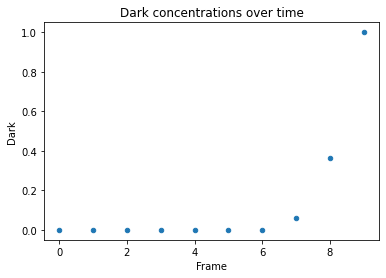

In [15]:
# Visualize the dark data
df.plot(kind='scatter',x='Frame',y='Dark',title = 'Dark concentrations over time')

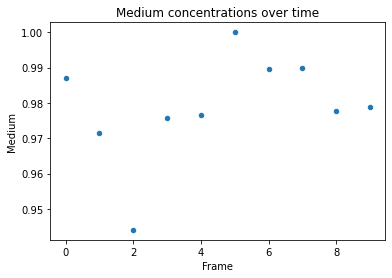

In [16]:
df.plot(kind='scatter',x='Frame',y='Medium', title = 'Medium concentrations over time')

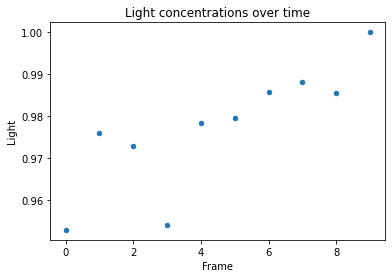

In [17]:
df.plot(kind='scatter',x='Frame',y='Light', title = 'Light concentrations over time')